In [1]:
!python --version

Python 3.10.1


In [2]:
import os
import sys

import torch
from PIL import Image
import requests

import matplotlib.pyplot as plt
import cv2
import numpy as np

In [3]:
# path_repo_lavis = '/home/andreina/Repo/LAVIS/'
# sys.path.append(path_repo_lavis)

In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [5]:
import lavis
from lavis.models import model_zoo
from lavis.models import load_model_and_preprocess
from lavis.common.gradcam import getAttMap
from lavis.models.blip_models.blip_image_text_matching import compute_gradcam

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/fairscale/experimental/nn/offload.py:19: FutureWarning: `torch.cuda.amp.custom_fwd(args...)` is deprecated. Please use `torch.amp.custom_fwd(args..., device_type='cuda')` instead.
  return torch.cuda.amp.custom_fwd(orig_func)  # type: ignore
/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/fairscale/experimental/nn/offload.py:30: FutureWarning: `torch.cuda.amp.custom_bwd(args...)` is deprecated. Please use `torch.amp.custom_bwd(args..., device_type='cuda')` instead.
  return torch.cuda.amp.custom_bwd(orig_func)  # type: ignore


In [6]:
print(model_zoo)

Architectures                  Types
albef_classification           ve
albef_feature_extractor        base
albef_nlvr                     nlvr
albef_pretrain                 base
albef_retrieval                coco, flickr
albef_vqa                      vqav2
alpro_qa                       msrvtt, msvd
alpro_retrieval                msrvtt, didemo
blip_caption                   base_coco, large_coco
blip_classification            base
blip_feature_extractor         base
blip_image_text_matching       base, large
blip_nlvr                      nlvr
blip_pretrain                  base
blip_retrieval                 coco, flickr
blip_vqa                       vqav2, okvqa, aokvqa
blip2_opt                      pretrain_opt2.7b, pretrain_opt6.7b, caption_coco_opt2.7b, caption_coco_opt6.7b
blip2_t5                       pretrain_flant5xl, pretrain_flant5xl_vitL, pretrain_flant5xxl, caption_coco_flant5xl
blip2_feature_extractor        pretrain, pretrain_vitL, coco
blip2                      

In [7]:
def get_image_from_path(img_path):
    return Image.open(img_path).convert('RGB')

def get_image_from_url(img_url):
    return Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
    
def resize_image(raw_image, size=(224, 224)):
    aux_image = np.array(raw_image)
    aux_image = cv2.resize(aux_image, size)
    raw_image = Image.fromarray(aux_image)
    return raw_image

def calculate_similarity(raw_img, caption, model, vis_processors, txt_processors):
    image = vis_processors["eval"](raw_img).unsqueeze(0).to(device)
    text_input = txt_processors["eval"](caption)
    sample = {"image": image, "text_input": [text_input]}
    feat_multimodal = model.extract_features(sample)
    feat_img = model.extract_features(sample, mode="image")
    feat_text = model.extract_features(sample, mode="text")

    similarity = feat_img.image_embeds_proj[:,0,:] @ feat_text.text_embeds_proj[:,0,:].t()
    return similarity

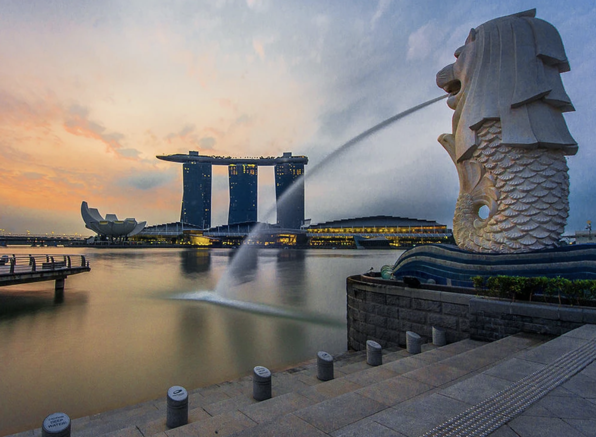

In [6]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
display(raw_image.resize((596, 437)))

In [7]:
# loads BLIP caption base model, with finetuned checkpoints on MSCOCO captioning dataset.
# this also loads the associated image processors
model, vis_processors, txt_processors = load_model_and_preprocess(name="blip_caption", model_type="base_coco", is_eval=True, device=device)
# preprocess the image
# vis_processors stores image transforms for "train" and "eval" (validation / testing / inference)
image = vis_processors["eval"](raw_image).unsqueeze(0).to(device)
# generate caption
model.generate({"image": image})
# ['a large fountain spewing water into the air']

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/lavis/models/base_model.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via 

['a large fountain spewing water into the air']

In [8]:
txt_model = model._modules["text_decoder"]
vis_model = model._modules["visual_encoder"]

### Text params

In [9]:
# Get the total number of parameters
total_params = sum(p.numel() for p in txt_model.parameters())

# Get the number of trainable parameters
trainable_params = sum(p.numel() for p in txt_model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params}")
print(f"Trainable parameters: {trainable_params}")

Total parameters: 137881148
Trainable parameters: 137881148


### Visual params

In [10]:
# Get the total number of parameters
total_params_vis = sum(p.numel() for p in vis_model.parameters())

# Get the number of trainable parameters
trainable_params_vis = sum(p.numel() for p in vis_model.parameters() if p.requires_grad)

print(f"Total parameters: {total_params_vis}")
print(f"Trainable parameters: {trainable_params_vis}")

Total parameters: 86090496
Trainable parameters: 86090496


In [12]:
# Specify the directory to iterate over
directory_path = "dataset_T2"  # Replace with your actual directory
dict_res = {}

# Iterate over the files in the directory
for filename in os.listdir(directory_path):
    filepath = os.path.join(directory_path, filename)

    # Check if the file is a regular file (not a directory) and if it's an image
    if os.path.isfile(filepath) and (filename.lower().endswith(('.png', '.jpg', '.jpeg'))):
        try:
            # Open the image using PIL
            raw_image = Image.open(filepath).convert('RGB')

            image = vis_processors["eval"](raw_image).unsqueeze(0).to(device)
            # generate caption
            captions = model.generate({"image": image}, use_nucleus_sampling=True, num_captions=3)
            dict_res[filename] = captions
        except IOError:
            print(f"Could not open or read image file: {filename}")
    else:
        print(f"Skipping non-image file: {filename}")

Skipping non-image file: .git
Skipping non-image file: README.md


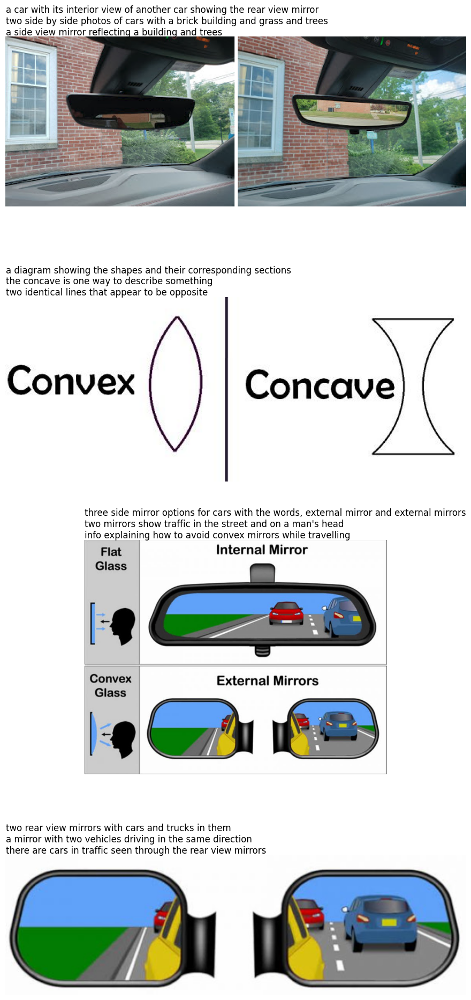

In [13]:
# Create a figure and axes for subplots
fig, axes = plt.subplots(len(dict_res), 1, figsize=(10, 5 * len(dict_res)))  # Adjust figsize as needed

# Iterate over the images and captions
i = 0
for filename, captions in dict_res.items():
    filepath = os.path.join(directory_path, filename)

    try:
        # Open the image using PIL
        img = Image.open(filepath)

        # Display the image
        axes[i].imshow(img)
        # axes[i].set_title(filename)
        axes[i].axis("off")

        # Display the captions below the image
        caption_text = "\n".join(captions)  # Combine captions into a single string
        axes[i].text(0, 0, caption_text, fontsize=12, va="bottom", ha="left") # adjust position as needed
        i+=1

    except FileNotFoundError:
        print(f"Image file not found: {filepath}")
    except Exception as e:
        print(f"Error processing {filename}: {e}")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

## VQA

In [14]:
model_vqa, vis_processors_vqa, txt_processors_vqa = load_model_and_preprocess(name="blip_vqa", model_type="vqav2", is_eval=True, device=device)
# ask a random question.

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(
/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/lavis/models/base_model.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via 

In [15]:
question = "Which city is this photo taken?"
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')
image = vis_processors_vqa["eval"](raw_image).unsqueeze(0).to(device)
question = txt_processors_vqa["eval"](question)
model_vqa.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")
# ['singapore']

['singapore']

In [18]:
question = "What is in the photo?"
question = txt_processors_vqa["eval"](question)
model_vqa.predict_answers(samples={"image": image, "text_input": question}, inference_method="generate")

['fountain']

In [22]:
# Specify the directory to iterate over
directory_path = "dataset_T2"  # Replace with your actual directory
dict_res_vqa = {}

question = "What are the differences between the first and second picture in the image?"
question_prep = txt_processors_vqa["eval"](question)

# Iterate over the files in the directory
for filename in os.listdir(directory_path):
    filepath = os.path.join(directory_path, filename)

    # Check if the file is a regular file (not a directory) and if it's an image
    if os.path.isfile(filepath) and (filename.lower().endswith(('.png', '.jpg', '.jpeg'))):
        try:
            # Open the image using PIL
            raw_image = Image.open(filepath).convert('RGB')

            image = vis_processors_vqa["eval"](raw_image).unsqueeze(0).to(device)
            # generate caption
            captions = model_vqa.predict_answers(samples={"image": image, "text_input":question_prep}, inference_method="generate")
            dict_res_vqa[filename] = captions
        except IOError:
            print(f"Could not open or read image file: {filename}")
    else:
        print(f"Skipping non-image file: {filename}")

Skipping non-image file: .git
Skipping non-image file: README.md


In [24]:
dict_res_vqa

{'blazer-camera-comparison-2.png': ['reflection of car in rear view mirror'],
 'convex-vs-concave-lens.jpg': ['shape and size'],
 'mirror.jpg': ['car vs motorcycle'],
 'car_mirror.png': ['car vs bus']}

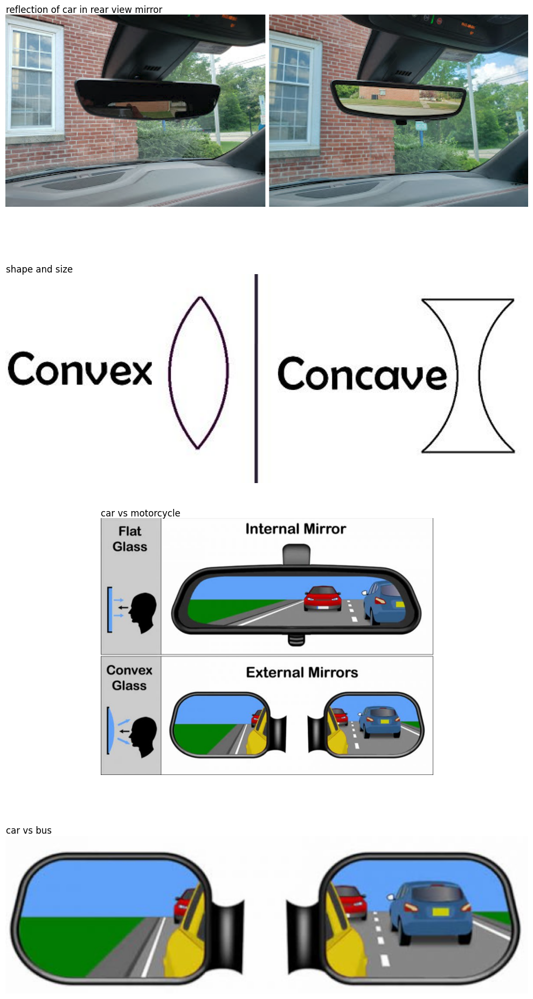

In [23]:
# Create a figure and axes for subplots
fig, axes = plt.subplots(len(dict_res), 1, figsize=(10, 5 * len(dict_res)))  # Adjust figsize as needed

# Iterate over the images and captions
i = 0
for filename, captions in dict_res_vqa.items():
    filepath = os.path.join(directory_path, filename)

    try:
        # Open the image using PIL
        img = Image.open(filepath)

        # Display the image
        axes[i].imshow(img)
        # axes[i].set_title(filename)
        axes[i].axis("off")

        # Display the captions below the image
        caption_text = "\n".join(captions)  # Combine captions into a single string
        axes[i].text(0, 0, caption_text, fontsize=12, va="bottom", ha="left") # adjust position as needed
        i+=1

    except FileNotFoundError:
        print(f"Image file not found: {filepath}")
    except Exception as e:
        print(f"Error processing {filename}: {e}")

# Adjust layout and display the plot
plt.tight_layout()
plt.show()

### Unified feature extraction interface

In [55]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
raw_image = Image.open(requests.get(img_url, stream=True).raw).convert('RGB')

In [56]:
raw_image_cv2 = np.array(raw_image)
raw_image_cv2 = cv2.resize(raw_image_cv2, (224, 224))
raw_image = Image.fromarray(raw_image_cv2)

In [57]:
model_fe, vis_processors_fe, txt_processors_fe = load_model_and_preprocess(name="blip_feature_extractor", model_type="base", is_eval=True, device=device)

In [58]:
caption = "a large fountain spewing water into the air"
image = vis_processors_fe["eval"](raw_image).unsqueeze(0).to(device)
text_input = txt_processors_fe["eval"](caption)
sample = {"image": image, "text_input": [text_input]}

In [59]:
features_multimodal = model_fe.extract_features(sample)
print(features_multimodal.multimodal_embeds.shape)

torch.Size([1, 12, 768])


In [60]:
features_image = model_fe.extract_features(sample, mode="image")
features_text = model_fe.extract_features(sample, mode="text")
print(features_image.image_embeds.shape)
# torch.Size([1, 197, 768])
print(features_text.text_embeds.shape)
# torch.Size([1, 12, 768])

torch.Size([1, 197, 768])
torch.Size([1, 12, 768])


In [61]:
# low-dimensional projected features
print(features_image.image_embeds_proj.shape)
# torch.Size([1, 197, 256])
print(features_text.text_embeds_proj.shape)
# torch.Size([1, 12, 256])
similarity = features_image.image_embeds_proj[:,0,:] @ features_text.text_embeds_proj[:,0,:].t()
print(similarity)

torch.Size([1, 197, 256])
torch.Size([1, 12, 256])
tensor([[0.2661]], device='cuda:0')


In [62]:
img_path = 'dataset_T2/merlion_fire.png'
r_img = Image.open(img_path).convert('RGB')

r_img_cv2 = np.array(r_img)
r_img_cv2 = cv2.resize(r_img_cv2, (224, 224))
r_img = Image.fromarray(r_img_cv2)

img_fire = vis_processors_fe["eval"](r_img).unsqueeze(0).to(device)

In [63]:
sample2 = {"image": img_fire, "text_input": [text_input]}
feat_multimodal2 = model_fe.extract_features(sample2)
feat_img2 = model_fe.extract_features(sample2, mode="image")

In [64]:
sim2 = feat_img2.image_embeds_proj[:,0,:] @ features_text.text_embeds_proj[:,0,:].t()
print(sim2)

tensor([[0.1996]], device='cuda:0')


In [69]:
caption2 = "a large fountain spewing fire"
text_input2 = txt_processors_fe["eval"](caption2)

In [70]:
sample2 = {"image": img_fire, "text_input": [text_input2]}
feat_multimodal2 = model_fe.extract_features(sample2)
feat_img2 = model_fe.extract_features(sample2, mode="image")

sim2 = feat_img2.image_embeds_proj[:,0,:] @ features_text.text_embeds_proj[:,0,:].t()
print(sim2)

tensor([[0.1996]], device='cuda:0')


In [78]:
img_path

'dataset_T2/merlion_fire.png'

In [76]:
img = get_image_from_path(img_path)
capt = "a large fountain spewing water into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.1996]], device='cuda:0')

In [77]:
img = get_image_from_path(img_path)
capt = "a large fountain spewing fire into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.2419]], device='cuda:0')

In [79]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "a large fountain spewing water into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.2661]], device='cuda:0')

In [80]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "a large fountain spewing fire into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.2587]], device='cuda:0')

In [81]:
capt = "the merlion park fountain"
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)

In [82]:
sim

tensor([[0.3118]], device='cuda:0')

In [83]:
img = get_image_from_path(img_path)
capt = "the merlion park fountain"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.2639]], device='cuda:0')

In [88]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "the merlion park fountain at singapore"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.3096]], device='cuda:0')

In [89]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "the merlion park fountain from singapore"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.3220]], device='cuda:0')

In [90]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "the merlion park singapore fountain"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_fe, vis_processors_fe, txt_processors_fe)
sim

tensor([[0.3069]], device='cuda:0')

In [91]:
image = vis_processors_fe["eval"](img).unsqueeze(0).to(device)
text_input = txt_processors_fe["eval"](capt)
sample = {"image": image, "text_input": [text_input]}

In [92]:
features_image = model_fe.extract_features(sample, mode="image")
features_text = model_fe.extract_features(sample, mode="text")

In [93]:
print(features_image.image_embeds.shape)
print(features_text.text_embeds.shape)

torch.Size([1, 197, 768])
torch.Size([1, 8, 768])


In [94]:
print(features_image.image_embeds_proj.shape)
print(features_text.text_embeds_proj.shape)

torch.Size([1, 197, 256])
torch.Size([1, 8, 256])


In [95]:
type(features_image)

lavis.models.blip_models.blip_outputs.BlipOutputFeatures

In [96]:
features_image.image_embeds_proj[:,0,:].shape

torch.Size([1, 256])

In [97]:
features_text.text_embeds_proj[:,0,:].t().shape

torch.Size([256, 1])

In [99]:
model_fe

BlipFeatureExtractor(
  (visual_encoder): VisionTransformerEncoder(
    (patch_embed): PatchEmbed(
      (proj): Conv2d(3, 768, kernel_size=(16, 16), stride=(16, 16))
      (norm): Identity()
    )
    (pos_drop): Dropout(p=0.0, inplace=False)
    (blocks): ModuleList(
      (0-11): 12 x Block(
        (norm1): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (attn): Attention(
          (qkv): Linear(in_features=768, out_features=2304, bias=True)
          (attn_drop): Dropout(p=0.0, inplace=False)
          (proj): Linear(in_features=768, out_features=768, bias=True)
          (proj_drop): Dropout(p=0.0, inplace=False)
        )
        (drop_path): Identity()
        (norm2): LayerNorm((768,), eps=1e-06, elementwise_affine=True)
        (mlp): Mlp(
          (fc1): Linear(in_features=768, out_features=3072, bias=True)
          (act): GELU(approximate='none')
          (fc2): Linear(in_features=3072, out_features=768, bias=True)
          (drop): Dropout(p=0.0, inplace=

### Zero-shot classification

In [ ]:
cls_names = ["merlion", "sky", "giraffe", "fountain", "marina bay"]

# (optional) add prompt when we want to use the model for zero-shot classification
from lavis.processors.blip_processors import BlipCaptionProcessor
text_processor = BlipCaptionProcessor(prompt="A picture of ")

cls_prompt = [text_processor(cls_nm) for cls_nm in cls_names]
cls_prompt

In [ ]:
image = vis_processors["eval"](raw_image).unsqueeze(0).to(device)

In [ ]:
sample = {"image": image, "text_input": cls_names}

image_features = model.extract_features(sample, mode="image").image_embeds_proj[:, 0]
text_features = model.extract_features(sample, mode="text").text_embeds_proj[:, 0]

In [ ]:
sims = (image_features @ text_features.t())[0] / model.temp
probs = torch.nn.Softmax(dim=0)(sims).tolist()

for cls_nm, prob in zip(cls_names, probs):
    print(f"{cls_nm}: \t {prob:.3%}")

In [14]:
model_tml, vis_processors_tml, text_processors_tml = load_model_and_preprocess("blip_image_text_matching", "large", device=device, is_eval=True)

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/huggingface_hub/file_download.py:797: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/lavis/models/base_model.py:40: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via

In [38]:
# caption = "Merlion near marina bay."
caption = "Merlion spewing water into the air"

In [39]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
raw_image = get_image_from_url(img_url)

In [40]:
dst_w = 720
w, h = raw_image.size
scaling_factor = dst_w / w

resized_img = raw_image.resize((int(w * scaling_factor), int(h * scaling_factor)))
norm_img = np.float32(resized_img) / 255

In [41]:
img = vis_processors_tml["eval"](raw_image).unsqueeze(0).to(device)
txt = text_processors_tml["eval"](caption)

In [50]:
txt_tokens = model_tml.tokenizer(txt, return_tensors="pt").to(device)
gradcam, _ = compute_gradcam(model_tml, img, txt, txt_tokens, block_num=7)

In [51]:
avg_gradcam = getAttMap(norm_img, np.asarray(gradcam[0][1]), blur=True)

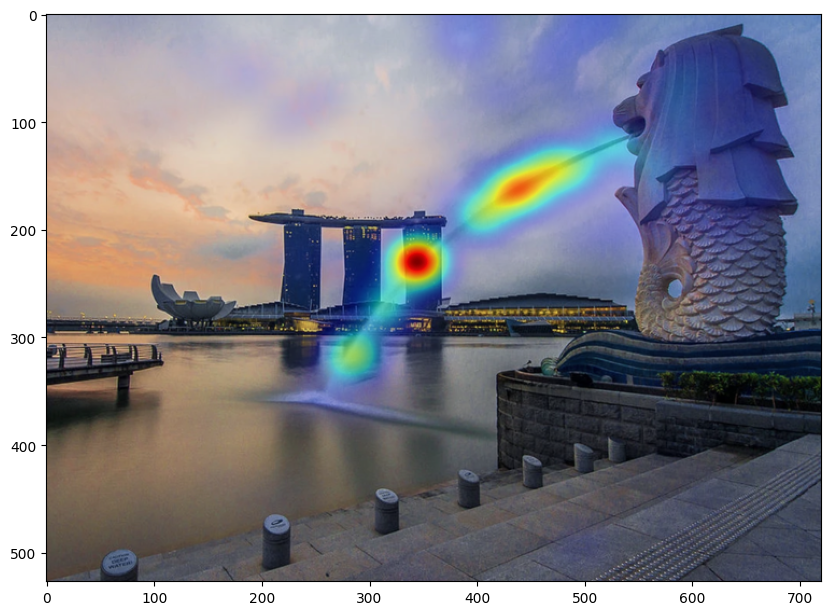

In [52]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(avg_gradcam)

In [55]:
gradcam[0].shape

torch.Size([12, 24, 24])

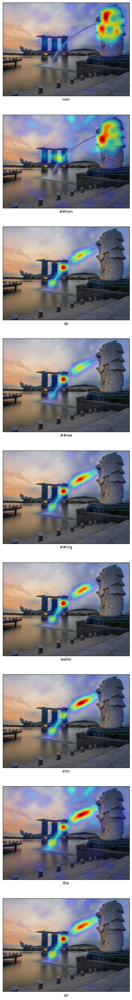

In [56]:
num_image = len(txt_tokens.input_ids[0]) - 2
fig, ax = plt.subplots(num_image, 1, figsize=(15, 5 * num_image))

gradcam_iter = iter(gradcam[0][2:-1])
token_id_iter = iter(txt_tokens.input_ids[0][1:-1])

for i, (gradcam_i, token_id) in enumerate(zip(gradcam_iter, token_id_iter)):
    word = model_tml.tokenizer.decode([token_id])
    gradcam_image = getAttMap(norm_img, np.asarray(gradcam_i), blur=True)
    ax[i].imshow(gradcam_image)
    ax[i].set_yticks([])
    ax[i].set_xticks([])
    ax[i].set_xlabel(word)

In [57]:
caption = "Merlion spewing fire into the air"
raw_image = get_image_from_path('dataset_T2/merlion_fire.png')

resized_img = raw_image.resize((int(w * scaling_factor), int(h * scaling_factor)))
norm_img = np.float32(resized_img) / 255

In [58]:
img = vis_processors_tml["eval"](raw_image).unsqueeze(0).to(device)
txt = text_processors_tml["eval"](caption)

txt_tokens = model_tml.tokenizer(txt, return_tensors="pt").to(device)
gradcam, _ = compute_gradcam(model_tml, img, txt, txt_tokens, block_num=7)

avg_gradcam = getAttMap(norm_img, np.asarray(gradcam[0][1]), blur=True)

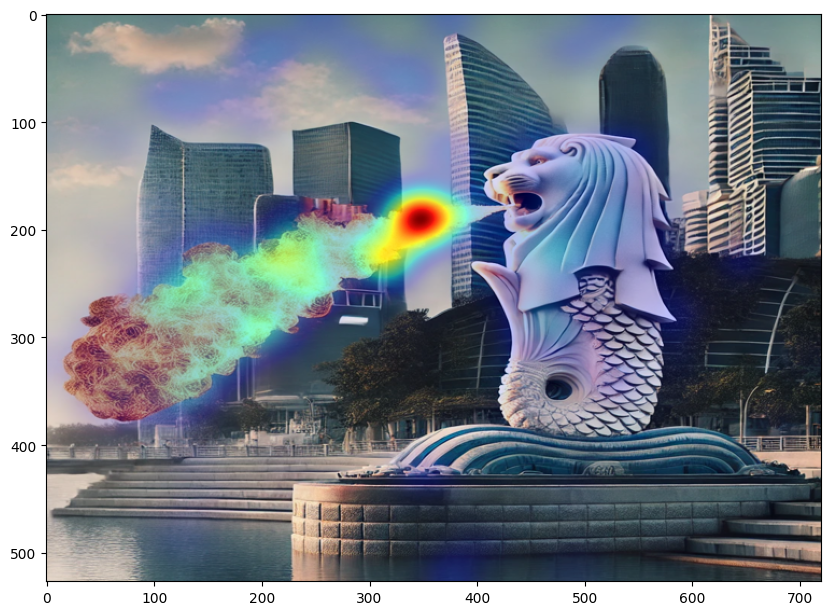

In [59]:
fig, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(avg_gradcam)

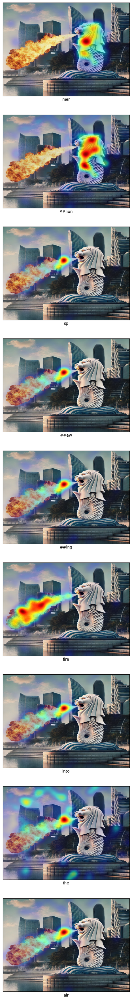

In [60]:
num_image = len(txt_tokens.input_ids[0]) - 2
fig, ax = plt.subplots(num_image, 1, figsize=(15, 5 * num_image))

gradcam_iter = iter(gradcam[0][2:-1])
token_id_iter = iter(txt_tokens.input_ids[0][1:-1])

for i, (gradcam_i, token_id) in enumerate(zip(gradcam_iter, token_id_iter)):
    word = model_tml.tokenizer.decode([token_id])
    gradcam_image = getAttMap(norm_img, np.asarray(gradcam_i), blur=True)
    ax[i].imshow(gradcam_image)
    ax[i].set_yticks([])
    ax[i].set_xticks([])
    ax[i].set_xlabel(word)

## Blip2

In [100]:
model_b2, vis_processors_b2, txt_processors_b2 = load_model_and_preprocess(name="blip2_feature_extractor", model_type="pretrain", is_eval=True, device=device)


/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/lavis/models/eva_vit.py:433: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = t

pytorch_model.bin:   0%|          | 0.00/440M [00:00<?, ?B/s]

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/transformers/modeling_utils.py:415: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  return t

In [101]:
device

device(type='cuda')

In [102]:
image = vis_processors_b2["eval"](raw_image).unsqueeze(0).to(device)
text_input = txt_processors_b2["eval"](caption)
sample = {"image": image, "text_input": [text_input]}

In [103]:
features_multimodal = model_b2.extract_features(sample)
# 32 is the number of queries
print(features_multimodal.multimodal_embeds.shape)

/home/andreina/.pyenv/versions/3.10.1/envs/blip2_3101/lib/python3.10/site-packages/lavis/models/blip2_models/blip2.py:42: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  return torch.cuda.amp.autocast(dtype=dtype)


torch.Size([1, 32, 768])


In [104]:
features_image = model_b2.extract_features(sample, mode="image")
features_text = model_b2.extract_features(sample, mode="text")
print(features_image.image_embeds.shape)
# torch.Size([1, 32, 768])
print(features_text.text_embeds.shape)
# torch.Size([1, 12, 768])

torch.Size([1, 32, 768])
torch.Size([1, 12, 768])


In [105]:
# low-dimensional projected features
print(features_image.image_embeds_proj.shape)
# torch.Size([1, 32, 256])
print(features_text.text_embeds_proj.shape)
# torch.Size([1, 12, 256])
similarity = (features_image.image_embeds_proj @ features_text.text_embeds_proj[:,0,:].t()).max()
print(similarity)
# tensor([[0.3642]])

torch.Size([1, 32, 256])
torch.Size([1, 12, 256])
tensor(0.3622, device='cuda:0')


In [106]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "a large fountain spewing fire into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_b2, vis_processors_b2, txt_processors_b2)
sim

tensor([[0.3456]], device='cuda:0')

In [107]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)
capt = "a large fountain spewing water into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_b2, vis_processors_b2, txt_processors_b2)
sim

tensor([[0.3500]], device='cuda:0')

In [108]:
img = get_image_from_path(img_path)
capt = "a large fountain spewing water into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_b2, vis_processors_b2, txt_processors_b2)
sim

tensor([[0.3090]], device='cuda:0')

In [109]:
img = get_image_from_path(img_path)
capt = "a large fountain spewing fire into the air"
img = resize_image(img)
sim = calculate_similarity(img, capt, model_b2, vis_processors_b2, txt_processors_b2)
sim

tensor([[0.3652]], device='cuda:0')

### Text Matching

In [114]:
try: 
    # del model_b2
    # del vis_processors_b2
    # del txt_processsors_b2
    del model_fe
    del vis_processors_fe
    del txt_processors_fe
    del model
    del vis_processors
    del txt_processors
    del model_vqa
    del vis_processors_vqa
    del txt_processors_vqa
except Exception as e:
    print(e)

In [115]:
model_tm, vis_processors_tm, text_processors_tm = load_model_and_preprocess("blip2_image_text_matching", "pretrain", device=device, is_eval=True)

In [116]:
caption = "merlion in Singapore"
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
img = get_image_from_url(img_url)

In [118]:
img = vis_processors_tm["eval"](img).unsqueeze(0).to(device)
txt = text_processors_tm["eval"](caption)

In [120]:
itm_output = model_tm({"image": img, "text_input": txt}, match_head="itm")
itm_scores = torch.nn.functional.softmax(itm_output, dim=1)
print(f'The image and text are matched with a probability of {itm_scores[:, 1].item():.3%}')

The image and text are matched with a probability of 98.567%


In [122]:
itc_score = model_tm({"image": img, "text_input": txt}, match_head='itc')
print('The image feature and text feature has a cosine similarity of %.4f'%itc_score)

The image feature and text feature has a cosine similarity of 0.4275


In [123]:
del model_tm
del vis_processors_tm
del text_processors_tm

### Instructed generation

Da problemas en este computador, al parecer requiere mas de 8GB de RAM de GPU. Probar en Colab, que ahi si da

In [6]:
model_g, vis_processors_g, text_processsors_g = load_model_and_preprocess(
    name="blip2_opt", model_type="pretrain_opt2.7b", is_eval=True, device=device
)

TypeError: load_model_and_preprocess() got an unexpected keyword argument 'weights_only'

In [ ]:
vis_processors_g.keys()

In [ ]:
img_url = 'https://storage.googleapis.com/sfr-vision-language-research/LAVIS/assets/merlion.png'
raw_image = get_image_from_url(img_url)
image = vis_processors_g["eval"](raw_image).unsqueeze(0).to(device)

In [ ]:
model_g.generate({"image": image})

In [ ]:
model_g.generate({"image": image}, use_nucleus_sampling=True, num_captions=3)

In [ ]:
model_g.generate({"image": image, "prompt": "Question: which city is this? Answer:"})

In [ ]:
model_g.generate({
    "image": image,
    "prompt": "Question: which city is this? Answer: singapore. Question: why?"})

In [ ]:
context = [
    ("which city is this?", "singapore"),
    ("why?", "it has a statue of a merlion"),
]
question = "where is the name merlion coming from?"
template = "Question: {} Answer: {}."

prompt = " ".join([template.format(context[i][0], context[i][1]) for i in range(len(context))]) + " Question: " + question + " Answer:"

print(prompt)

In [ ]:
model_g.generate(
    {
    "image": image,
    "prompt": prompt
    },
    use_nucleus_sampling=False,
)

### InstructBlip

Not available on git

In [9]:
model_ib, vis_processors_ib, text_processors_ib = load_model_and_preprocess(name="blip2_vicuna_instruct", model_type="vicuna7b", is_eval=True, device=device)

AttributeError: 'NoneType' object has no attribute 'from_pretrained'

In [ ]:
img_path = "/home/andreina/Documents/Repo/LAVIS/docs/_static/Confusing-Pictures.jpg"

In [8]:
raw_image = Image.open(img_path).convert("RGB")

SyntaxError: unterminated string literal (detected at line 1) (1762626720.py, line 1)